# Basketball YOLOv8
Dataset obtained in:

https://universe.roboflow.com/roboflow-universe-projects/basketball-players-fy4c2/dataset/25

Version YOLOv8

## Librerías iniciales

In [1]:
#Para limpiar caché
!find . -name "*.pyc" -delete
!find . -name "__pycache__" -type d -exec rm -r {} +

In [2]:
#Ultralytics update
!pip install -U ultralytics

In [3]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

In [4]:
#Estilo de gráficos a utilizar
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

## Plotting random train samples

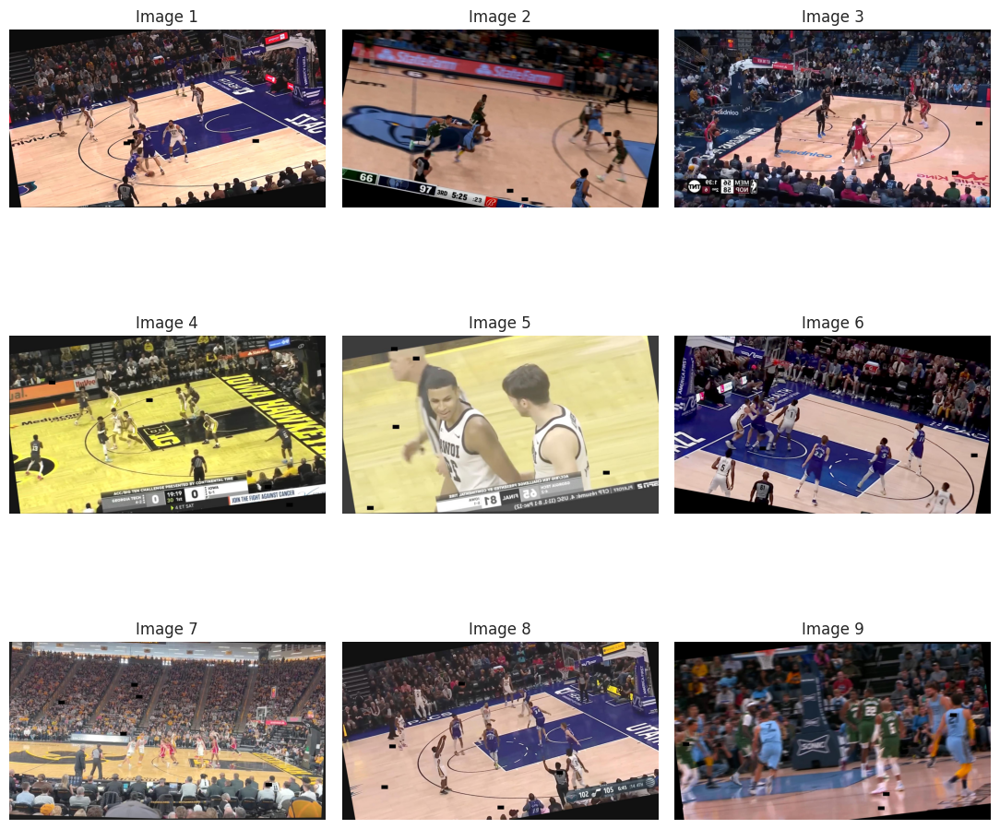

In [5]:
#Image directory for train samples
Image_dir = '/home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images'

#To show samples
num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images for plotting
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

## YOLOv8 Training

In [6]:
# Use a pretrained YOLOv8n model
model = YOLO("yolov8n.pt") 


image 1/1 /home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg: 384x640 13 persons, 1 umbrella, 3 chairs, 151.6ms
Speed: 3.8ms preprocess, 151.6ms inference, 6.1ms postprocess per image at shape (1, 3, 384, 640)


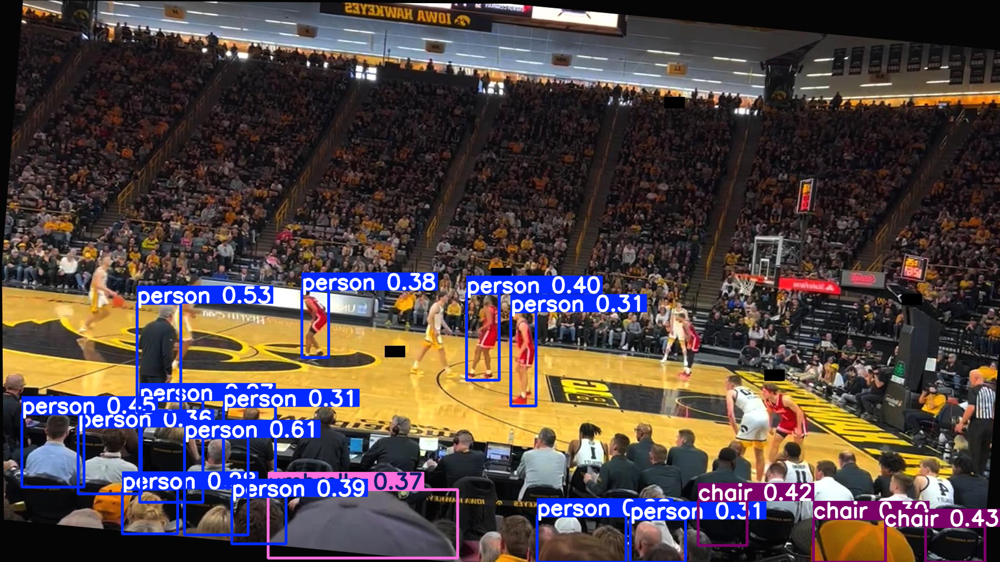

In [7]:
# Use the model to detect object
image = "/home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [8]:
# Build from YAML and transfer weights
Training_model = YOLO('yolov8n.pt')

In [9]:
#Training
Result_Training_model = Training_model.train(data="/home/alide/Documentos/IA/Proyecto/BasketballYv8/data.yaml",
                                             epochs = 50, batch = 4, optimizer = 'auto')

Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/alide/Documentos/IA/Proyecto/BasketballYv8/data.yaml, epochs=50, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_

train: Scanning /home/alide/Documentos/IA/Proyecto/BasketballYv8/train/labels.ca
val: Scanning /home/alide/Documentos/IA/Proyecto/BasketballYv8/valid/labels.cach

Plotting labels to runs/detect/train/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.458         98        640:  
       1/50         0G      1.815      2.645      1.364        167        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.498       0.18       0.22      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.262         62        640:  
       2/50         0G       1.58      1.513      1.257         93        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509       0.49      0.378      0.392      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.225         73        640:  
       3/50         0G      1.513      1.297      1.223         90        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.559      0.392      0.441      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.176        156        640:  
       4/50         0G      1.455      1.174      1.173        118        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.605       0.43      0.484      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.174        107        640:  
       5/50         0G      1.393       1.09      1.154        111        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.598      0.468      0.499      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.138        122        640:  
       6/50         0G      1.393      1.033       1.14        173        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.643      0.451      0.515       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.125        104        640:  
       7/50         0G      1.334     0.9781      1.114        160        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.599        0.5      0.541      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.089        126        640:  
       8/50         0G       1.33     0.9505      1.109         70        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.605      0.545      0.552      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.085        129        640:  
       9/50         0G      1.271     0.8877      1.084         70        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.634       0.53      0.545      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.082        109        640:  
      10/50         0G      1.265     0.8762      1.079        140        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.612      0.542      0.553      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.064        118        640:  
      11/50         0G       1.23     0.8462      1.065        106        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.673      0.526      0.551      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.065        146        640:  
      12/50         0G      1.244     0.8313      1.066        175        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.613       0.49      0.526      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.035         65        640:  
      13/50         0G      1.208     0.7928      1.045        106        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509        0.7      0.508      0.566      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.044         72        640:  
      14/50         0G      1.193     0.7802      1.045        106        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.727      0.487      0.557      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.033        107        640:  
      15/50         0G      1.173     0.7695      1.035        111        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.721       0.49       0.56      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.028         69        640:  
      16/50         0G      1.154     0.7474      1.028         68        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.713      0.503       0.57      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.031        124        640:  
      17/50         0G      1.156     0.7505      1.031         92        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.742      0.489      0.572      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.015         68        640:  
      18/50         0G      1.138     0.7249      1.015        129        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.696      0.522      0.593      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.011        147        640:  
      19/50         0G      1.115     0.7125      1.015        112        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.693      0.545      0.593      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.009         62        640:  
      20/50         0G      1.101     0.7032      1.007         81        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.791      0.507      0.595      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.004        159        640:  
      21/50         0G      1.093      0.689      1.004         55        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.685      0.564      0.626      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50         0G      1.087     0.6754      1.002        105        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.717      0.548      0.598      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50         0G      1.066     0.6664     0.9954        113        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.764      0.547      0.615      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50         0G      1.051     0.6557      0.987        126        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.692      0.618      0.632      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      1.049     0.6477     0.9902        126        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.744      0.544       0.61      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      1.055     0.6435     0.9884        144        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.709        0.6      0.639      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50         0G      1.031     0.6345     0.9809        126        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.696      0.582      0.629      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         0G      1.006      0.619     0.9729         76        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.801      0.541      0.616      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50         0G     0.9989     0.6171     0.9725         87        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.793      0.535      0.602      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50         0G      1.007     0.6197     0.9737        104        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.719      0.576      0.623      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G      1.015     0.6139     0.9762         79        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509       0.83      0.512      0.607      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G     0.9807     0.6003     0.9655        172        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.769      0.557      0.607      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         0G     0.9736     0.5917     0.9597        118        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.779      0.564      0.629        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G     0.9822     0.5993     0.9637         45        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.745      0.554      0.617      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G      0.961     0.5873     0.9566        109        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.713      0.581      0.626      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G     0.9526     0.5796     0.9531        176        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.805      0.562      0.633      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         0G     0.9374     0.5685     0.9464         72        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.786      0.565      0.638      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50         0G     0.9341     0.5663     0.9426        112        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509       0.79      0.541      0.616      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50         0G     0.9433     0.5663     0.9507         56        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.821      0.549      0.634       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G     0.9284     0.5598     0.9429         56        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509       0.76      0.561      0.634       0.41


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50         0G      0.884     0.5329     0.9177         55        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.663      0.616      0.612      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G     0.8633     0.5075      0.911         51        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.798      0.541      0.628      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50         0G     0.8528      0.502     0.9051         61        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.789      0.568      0.626      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G     0.8308     0.4948        0.9         59        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.802      0.564      0.642      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G     0.8172     0.4832     0.8955         69        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.804      0.563      0.628      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50         0G      0.811     0.4805     0.8936         31        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.785      0.582      0.636      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G     0.7964     0.4723     0.8895         51        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.749      0.587      0.638      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50         0G     0.7928     0.4691     0.8884         60        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.813      0.567      0.646      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50         0G     0.7839     0.4659     0.8888         56        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.741      0.594      0.641      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50         0G     0.7867     0.4687     0.8881         57        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.795      0.577      0.643      0.415



50 epochs completed in 5.687 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)
Model summary (fused): 72 layers, 3,007,403 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        100       1509      0.802      0.564      0.642      0.416
                  Ball         68         68      0.783     0.0882      0.179     0.0972
                  Hoop         78         78      0.952       0.91       0.92       0.59
                Period         67         68      0.741      0.378      0.497        0.3
                Player         99        762      0.841      0.885      0.891      0.568
                   Ref         86        189      0.883       0.76      0.876      0.638
            Shot Clock         46         46      0.887      0.348      0.599      0.353
             Team Name         38         76      0.574      0.618      0.587      0.384
           Team Points         80        161      0.716      0.733      0.714      0.478
        Time Remaining         61         61      0.844      0.355      0.514      0.335
Speed: 1.2ms preprocess, 64.0ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detec

## Post-training Results

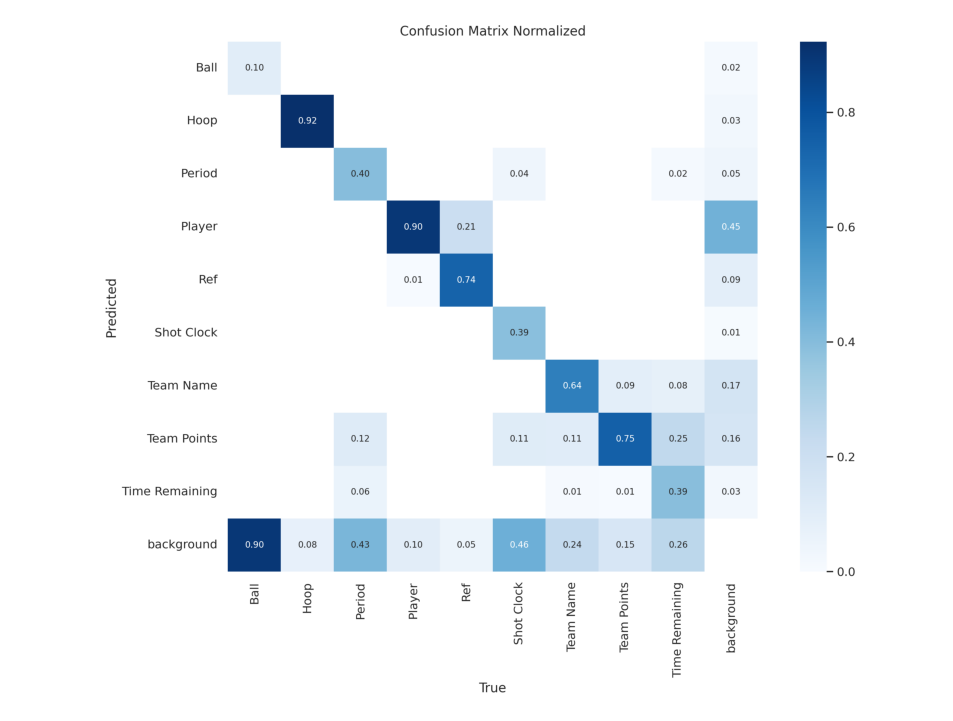

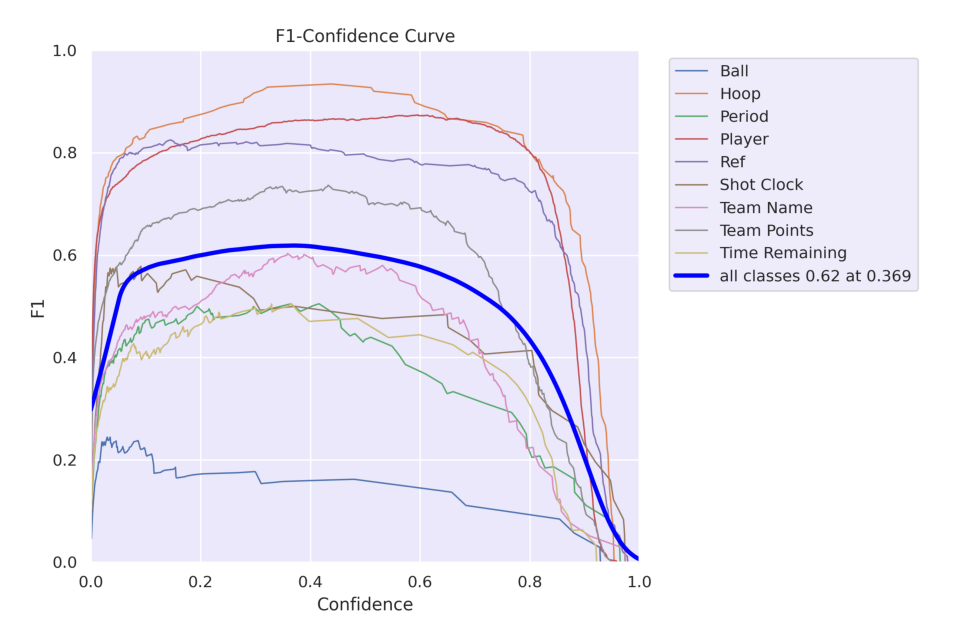

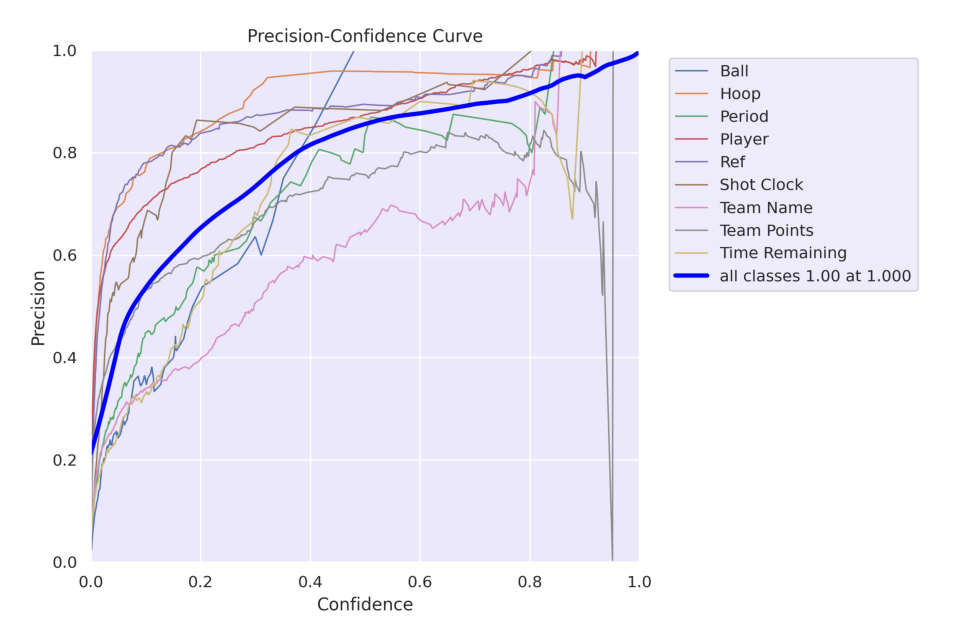

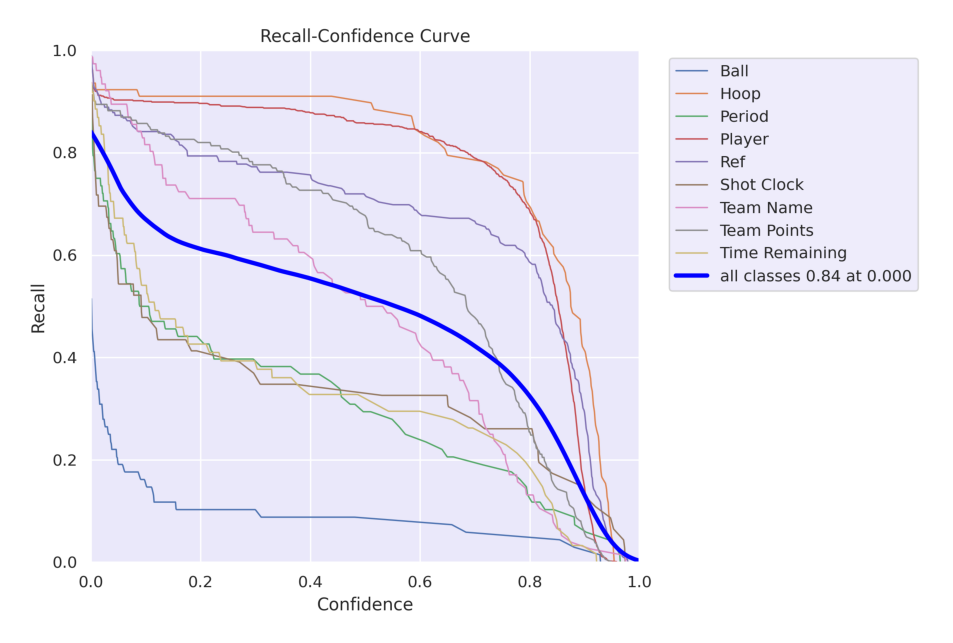

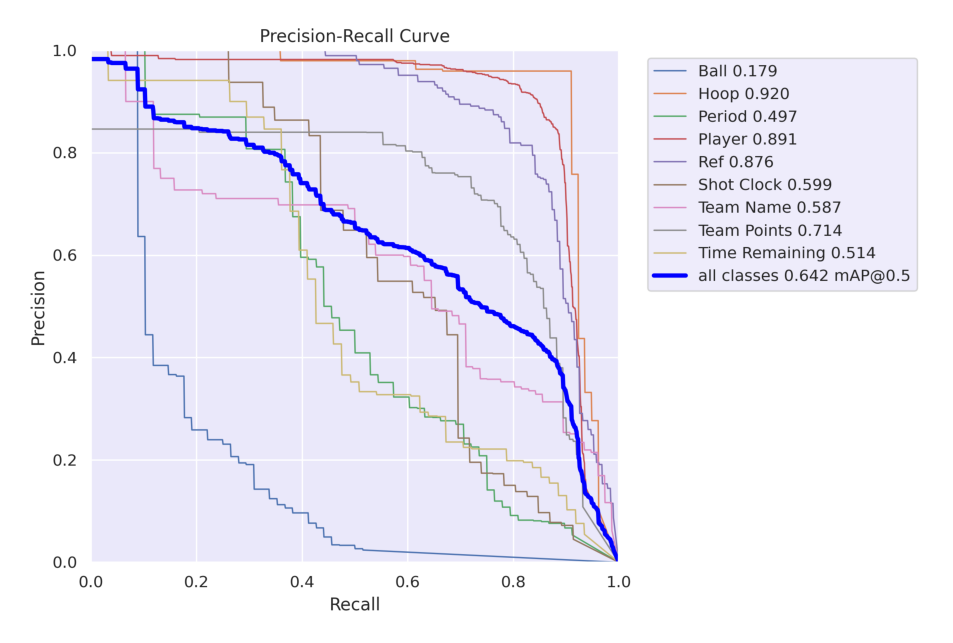

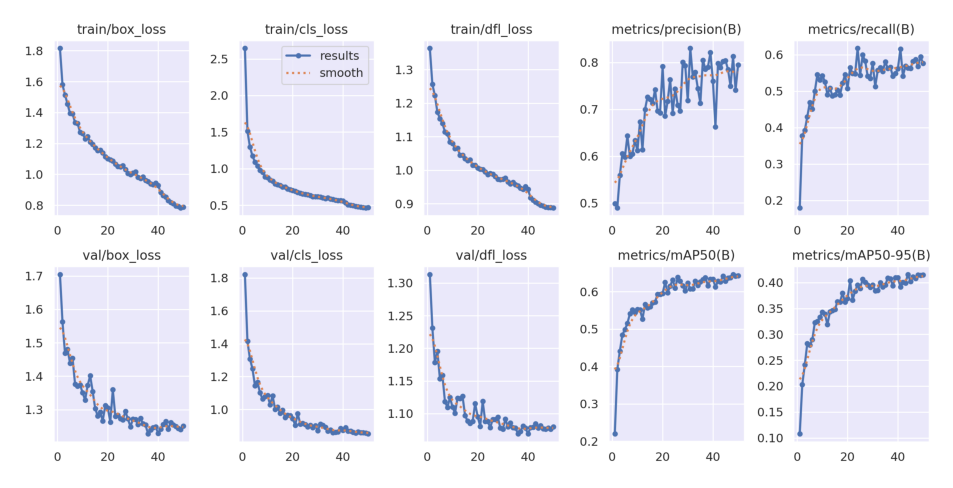

In [10]:
#Function for showing results
def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        if img is None:
            print(f"❌ Could not read image: {image_path}")
            continue
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '/home/alide/Documentos/IA/Proyecto/runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)

## Best performing model and example

In [11]:
# Loading the best performing model
Final_model = YOLO('/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Final_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)
Model summary (fused): 72 layers, 3,007,403 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /home/alide/Documentos/IA/Proyecto/BasketballYv8/valid/labels.cach
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        100       1509      0.802      0.564      0.642      0.416
                  Ball         68         68      0.783     0.0882      0.179     0.0972
                  Hoop         78         78      0.952       0.91       0.92       0.59
                Period         67         68      0.741      0.378      0.497        0.3
                Player         99        762      0.841      0.885      0.891      0.568
                   Ref         86        189      0.883       0.76      0.876      0.638
            Shot Clock         46         46      0.887      0.348      0.599      0.353
             Team Name         38         76      0.574      0.618      0.587      0.384
           Team Points         80        161      0.716      0.733      0.714      0.478
        Time Remaining         61         61      0.844      0.355      0.514      0.335
Speed: 0.8ms preprocess, 61.7ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detec

### Exporting the model

In [12]:
#Install dependencies
!pip install onnx
!pip install onnxruntime

In [13]:
#Export the model
Final_model.export(format='onnx')

Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)

PyTorch: starting from '/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 13, 8400) (5.9 MB)
requirements: Ultralytics requirement ['onnxslim'] not found, attempting AutoUpdate...
requirements: ❌ AutoUpdate skipped (offline)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: simplifier failure: No module named 'onnxslim'
ONNX: export success ✅ 0.6s, saved as '/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx' (11.7 MB)

Export complete (0.9s)
Results saved to /home/alide/Documentos/IA/Proyecto/runs/detect/train/weights
Predict:         yolo predict task=detect model=/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx imgsz=640 

'/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx'

### Example using Final_Model with the same img used with the pre trained model


image 1/1 /home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg: 384x640 1 Hoop, 11 Players, 4 Refs, 94.4ms
Speed: 3.4ms preprocess, 94.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


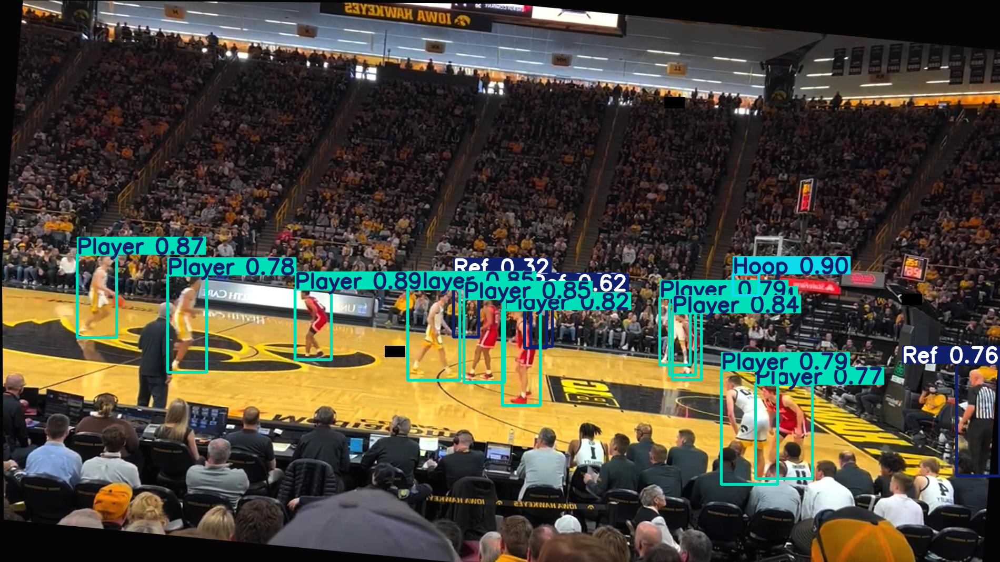

In [14]:
image = "/home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg"
result_predict = Final_model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

## FInal Model architecture

In [15]:
Final_model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (m): ModuleList(
          (0): Bottleneck(
            (cv1): Conv(
              (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
              (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
   